#1 Preparing dataset


##1.1 Download the dataset


In [ ]:
#Dowload data form drive
%%shell
pip -q install --upgrade --no-cache-dir gdown
gdown -q 1gpKibl9pDfUU_59M6z7S8dR3O7U94RMG
echo 'download: done => file: man_woman_face.zip'
rm -rf ./man_woman_face/
unzip -q man_woman_face.zip


download: done => file: man_woman_face.zip


## **Ba** tập dữ liệu train, validation và test được sử dụng trong quá trình huấn luyện và đánh giá mô hình máy học. Mỗi tập có mục đích riêng để đảm bảo tính chính xác và độ tin cậy của mô hình.

1. Tập huấn luyện (Training set):

   * Mục đích: Dùng để huấn luyện mô hình máy học. Mô hình sẽ học từ các mẫu dữ liệu trong tập này để hiểu các mẫu, tìm ra mối quan hệ và tạo ra các dự đoán.
   * Tập dữ liệu: Bao gồm các mẫu dữ liệu đã được gán nhãn.
   * Số lượng: Thường là tập dữ liệu lớn nhất trong ba tập.
   * Lưu ý: Tập huấn luyện không được sử dụng để đánh giá hoặc điều chỉnh mô hình.
2. Tập validation (Validation set):

   * Mục đích: Dùng để đánh giá hiệu suất của mô hình trong quá trình huấn luyện và điều chỉnh siêu tham số.
   * Tập dữ liệu: Bao gồm các mẫu dữ liệu đã được gán nhãn.
   * Số lượng: Thường là một phần nhỏ của tập huấn luyện.
   * Lưu ý: Tập validation không được sử dụng để huấn luyện mô hình, mà chỉ dùng để đánh giá và điều chỉnh mô hình.
3. Tập kiểm tra (Test set):

  * Mục đích: Dùng để đánh giá tổng quan hiệu suất của mô hình sau khi đã hoàn thành quá trình huấn luyện và điều chỉnh.
  * Tập dữ liệu: Bao gồm các mẫu dữ liệu đã được gán nhãn.
  * Số lượng: Thường là một phần nhỏ của tập dữ liệu ban đầu.
  * Lưu ý: Tập kiểm tra chỉ được sử dụng khi mô hình đã được hoàn thiện và không được điều chỉnh nữa. Nó giúp đánh giá tính tổng quan của mô hình trên dữ liệu mới mà nó chưa từng thấy.

Mục đích chính của việc chia tập dữ liệu thành ba phần là để đảm bảo rằng mô hình không bị overfitting (quá khớp) và có khả năng tổng quát hóa trên dữ liệu mới. Tập huấn luyện giúp mô hình học các mẫu dữ liệu, tập validation giúp điều chỉnh và tinh chỉnh mô hình, và tập kiểm tra giúp đ

In [ ]:
!mkdir train_folder
!mkdir test_folder
!mkdir valid_folder

In [ ]:
import os
import shutil
import random

# Tạo thư mục train và test
train_dir = '/content/train_folder'
test_dir = '/content/test_folder'
valid_dir = '/content/valid_folder'

os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)


In [ ]:
data_dir = '/content/faces'

# Danh sách các thư mục hình ảnh man và woman
folders = [f for f in os.listdir(data_dir) if ('man' in f or 'woman' in f)]

# Thiết lập tỷ lệ phân chia dữ liệu
train_ratio = 0.7  # Tỷ lệ dữ liệu train
test_ratio = 0.2  # Tỷ lệ dữ liệu test
valid_ratio = 0.1 # Tỷ lệ dữ liệu valid

for folder in folders:
    folder_path = os.path.join(data_dir, folder)
    images = os.listdir(folder_path)
    random.shuffle(images)  # Xáo trộn thứ tự của hình ảnh

    train_split = int(len(images) * train_ratio)
    test_split = int(len(images) * (train_ratio + test_ratio))

    train_images = images[:train_split]
    test_images = images[train_split:test_split]
    valid_images = images[test_split:]

    # Tạo thư mục train/man hoặc train/woman và sao chép các hình ảnh train vào đó
    if 'woman' in folder:
        train_folder = 'woman'
    elif 'man' in folder:
        train_folder = 'man'
    train_subdir = os.path.join(train_dir, train_folder)
    os.makedirs(train_subdir, exist_ok=True)
    for image in train_images:
        src_path = os.path.join(folder_path, image)
        dst_path = os.path.join(train_subdir, image)
        shutil.copy(src_path, dst_path)

    # Tạo thư mục test/man hoặc test/woman và sao chép các hình ảnh test vào đó
    if 'woman' in folder:
        test_folder = 'woman'
    elif 'man' in folder:
        test_folder = 'man'
    test_subdir = os.path.join(test_dir, test_folder)
    os.makedirs(test_subdir, exist_ok=True)
    for image in test_images:
        src_path = os.path.join(folder_path, image)
        dst_path = os.path.join(test_subdir, image)
        shutil.copy(src_path, dst_path)

    # Tạo thư mục test/man hoặc test/woman và sao chép các hình ảnh valid vào đó
    if 'woman' in folder:
        valid_folder = 'woman'
    elif 'man' in folder:
        valid_folder = 'man'
    valid_subdir = os.path.join(valid_dir, valid_folder)
    os.makedirs(valid_subdir, exist_ok=True)
    for image in valid_images:
        src_path = os.path.join(folder_path, image)
        dst_path = os.path.join(valid_subdir, image)
        shutil.copy(src_path, dst_path)


In [ ]:
import os

data_dir = '/content/test_folder/man'

# Lấy danh sách tên các file trong thư mục
files = os.listdir(data_dir)

# Đếm số lượng file hình ảnh
image_count = sum([1 for file in files if file.endswith(('.jpg', '.jpeg', '.png', '.gif'))])

print(f"Số lượng hình ảnh trong thư mục: {image_count}")

Số lượng hình ảnh trong thư mục: 3536


In [ ]:
import os

data_dir = '/content/valid_folder/man'

# Lấy danh sách tên các file trong thư mục
files = os.listdir(data_dir)

# Đếm số lượng file hình ảnh
image_count = sum([1 for file in files if file.endswith(('.jpg', '.jpeg', '.png', '.gif'))])

print(f"Số lượng hình ảnh trong thư mục: {image_count}")

Số lượng hình ảnh trong thư mục: 1768


In [ ]:
path_to_data = '/content/faces'

##1.2 Import libraries

In [ ]:
# Basic
import os
import glob
import numpy as np

# Data Viz
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

# Tensorflow for machine learning
import tensorflow as tf
import tensorflow.keras.utils as utils
import tensorflow.keras.applications as app
import tensorflow.keras.layers as layers
import tensorflow.keras as keras
from tensorflow.keras.applications.imagenet_utils import decode_predictions
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import BatchNormalization, Flatten, MaxPool2D
from keras.layers import Dense, GlobalAvgPool2D as GAP, Dropout
from keras.models import load_model

# Callbacks
from keras.callbacks import ModelCheckpoint, EarlyStopping


# Classification models
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB1
from tensorflow.keras.applications import VGG16, ResNet50, ResNet50V2, InceptionV3, Xception, \
        ResNet152, ResNet152V2, MobileNetV3Large,MobileNetV3Small,MobileNet


##1.3 Explore the dataset



1.   **Giới thiệu dataset:**
    *   Tập dataset "Biggest Gender+Face Recognition Dataset" là một bộ dữ liệu được chia sẻ trên Kaggle. Đây là một tập dữ liệu lớn về nhận dạng giới tính, được thu thập từ nhiều nguồn khác nhau trên Internet.

    *  Tập dataset này chứa hình ảnh các khuôn mặt người, được gắn nhãn với thông tin về giới tính của từng khuôn mặt. Tập dữ liệu bao gồm các hình ảnh đa dạng về giới tính, độ tuổi và chủng tộc. Nó có thể được sử dụng cho các bài toán nhận dạng giới tính và nhận dạng khuôn mặt trong lĩnh vực trí tuệ nhân tạo và thị giác máy tính.

    *  Tập dataset này có kích thước lớn và chứa hàng ngàn hình ảnh khuôn mặt được chia thành các thư mục con dựa trên giới tính và nhãn.Trong tập này được chia thành 2 class là giới tính nam và nữ



2.   **Giải quyết bài toán:**
     * Đây là bài toán về phân loại giới tính



###1.3.1 Get list of class names

In [ ]:
class_names = list(filter(lambda f: os.path.isdir(os.path.join(path_to_data, f)), os.listdir(path_to_data)))
class_names = sorted(class_names)
num_classes = len(class_names)
print(f"Class Names: \n{class_names}")
print(f"Total Number of Classes : {num_classes}")

Class Names: 
['man', 'woman']
Total Number of Classes : 2


###1.3.2 Viz the classes' distribution

In [ ]:
class_dis = [len(os.listdir(path_to_data + f"/{name}")) for name in class_names]
lk_dis = dict(zip(class_names, class_dis))
print(f"Class Distribution : \n{lk_dis}")

fig = px.pie(names=class_names, values=class_dis, width=600)
fig.update_layout({"title":{'text':"Class Distribution","x":0.5}})
fig.show()

Class Distribution : 
{'man': 17678, 'woman': 9489}


__Qua biểu đồ ta thấy được rằng số lượng mẫu của Nam là 17678 chiếm 65% tổng số mẫu và người nữ là 9489 chiếm 34,9% tổng số__

###1.3.3 Show some pictures

Found 27167 files belonging to 2 classes.


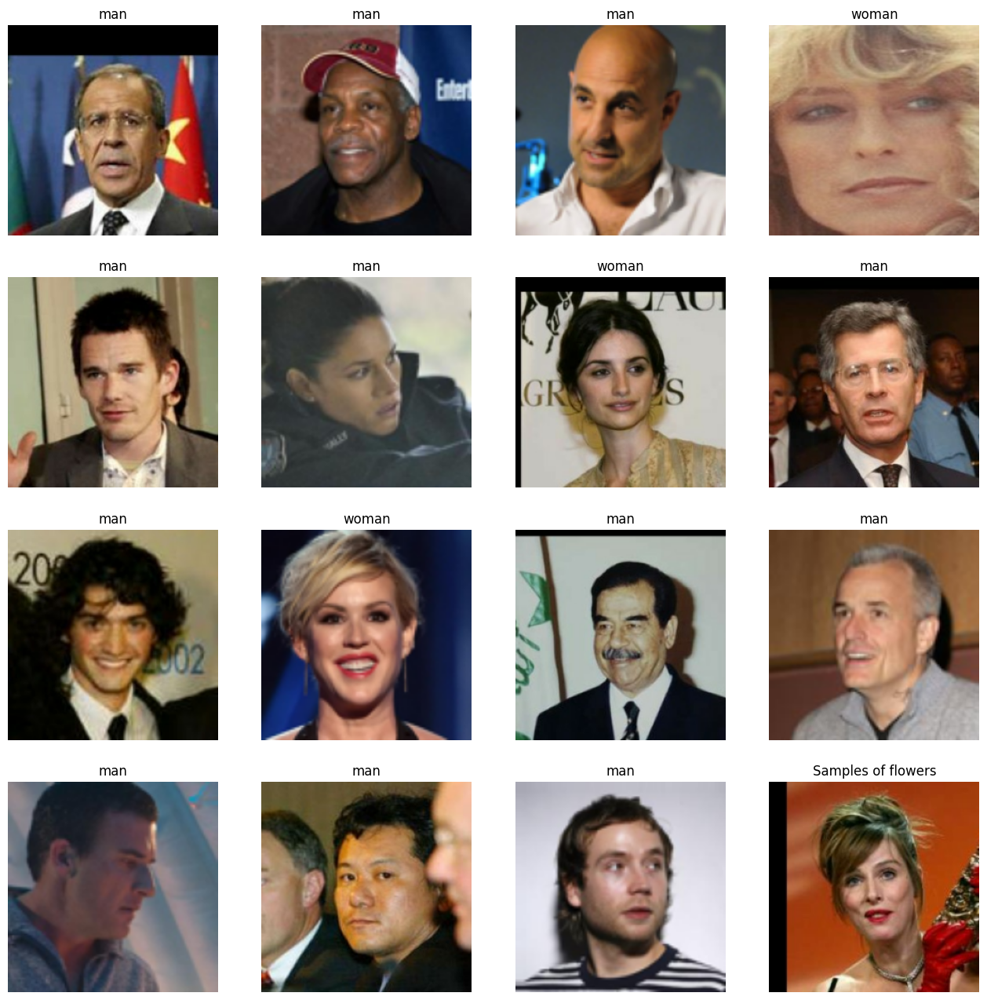

In [ ]:
dataset = tf.keras.utils.image_dataset_from_directory(
  path_to_data,
  image_size=(224, 224),
  batch_size=16,
  shuffle=True)

def show_images(dataset):
  plt.figure(figsize=(16,16))
  for images, labels in dataset.take(1):
    for i in range(16):
      ax = plt.subplot(4, 4, i + 1)
      ax.imshow(images[i].numpy().astype("uint8"))
      ax.set_title(dataset.class_names[labels[i]])
      ax.axis("off")
  plt.title("Samples of flowers")
  plt.show()

show_images(dataset)

##1.4 Information of Backbone(MobileNet)
1. MobileNet là một kiến trúc mạng nơ-ron sâu (deep neural network) được thiết kế đặc biệt cho việc phân loại ảnh và bài toán phân loại đối tượng trong thị giác máy tính. Kiến trúc này được phát triển bởi Google và được giới thiệu trong bài báo khoa học năm 2017. MobileNet có độ phức tạp thấp và độ chính xác cao, và có thể chạy trên các thiết bị di động với tốc độ nhanh.
2. MobileNet sử dụng kỹ thuật Depthwise Separable Convolution để giảm số lượng tham số. Thay vì sử dụng convolution layer truyền thống, Depthwise Separable Convolution sử dụng hai lớp convolution riêng biệt để thực hiện phép tích chập: convolution layer đầu tiên thực hiện phép tích chập trên mỗi kênh đầu vào (depthwise convolution), sau đó convolution layer thứ hai thực hiện phép tích chập trên tất cả các kênh đầu ra (pointwise convolution). Điều này giúp giảm số lượng tham số cần thiết để huấn luyện mô hình.
3. MobileNet có khoảng 4,2 triệu tham số và có thể được huấn luyện trên các tập dữ liệu phổ biến như ImageNet. Kiến trúc của MobileNet được xây dựng trên cơ sở kiến trúc của mô hình Inception v3 của Google.
4. Để hiển thị các đặc trưng trung gian của mô hình MobileNet, ta có thể sử dụng một số kỹ thuật như Grad-CAM (Gradient-weighted Class Activation Mapping) hoặc Guided Backpropagation. Tuy nhiên, việc hiển thị các đặc trưng trung gian của mô hình này không được đánh giá cao và không phải là mục đích chính của kiến trúc MobileNet.
5. Các thuộc tính của MobileNet(input_shape=None,alpha=1.0,depth_multiplier=1,dropout=0.001,include_top=True,weights="imagenet",input_tensor=None,pooling=None,classes=1000,classifier_activation="softmax",**kwargs):
* __input_shape__:kích thước của input tensor, bao gồm số chiều và kích thước của ảnh (height, width, channel), ở đây kích thước đầu vào của model sẽ là (244,244,3) nếu include_top = False
* __alpha__:hệ số điều chỉnh độ sâu của mạng. Giá trị này nằm trong khoảng (0, 1], thay đổi alpha sẽ thay đổi độ sâu của mô hình. Ví dụ, alpha = 0.5 sẽ giảm độ sâu của mạng đi một nửa.
* __depth_multiplier__:hệ số điều chỉnh số lượng channel của các convolutional layers trong mô hình. Giá trị này phải là một số nguyên dương. Khi depth_multiplier = 2, số lượng channel của mỗi layer sẽ tăng gấp đôi so với mô hình gốc.
* __dropout__:hệ số dropout, giúp tránh overfitting bằng cách loại bỏ một phần node trong quá trình training. Giá trị này phải nằm trong khoảng [0, 1].
* __include_top__:có bao gồm fully connected layers ở cuối mạng hay không.
* __weights__:trọng số của mạng, có thể là None (khởi tạo trọng số ngẫu nhiên), "imagenet" (load trọng số được huấn luyện trên tập dữ liệu ImageNet), hoặc đường dẫn đến file chứa trọng số đã được lưu trữ trước đó.
* __input_tensor__:tensor input của mạng.
* __pooling__: phương thức pooling cuối cùng của mạng, có thể là "avg" (average pooling) hoặc "max" (max pooling).
* __classes__:số lượng lớp trong tập dữ liệu.
* __classifier_activation__: hàm activation của fully connected layer cuối cùng, mặc định là "softmax". Nếu include_top = True sẽ được kích hoạt và ngược lại



###1.4.1 Define utilities and select a backbone

In [ ]:
feature_extractor = {
    "VGG16": VGG16(include_top=False, input_shape=(224, 224, 3), weights='imagenet'),
    "ResNet50": ResNet50(include_top=False, input_shape=(224, 224, 3), weights='imagenet'),
    "InceptionV3": InceptionV3(include_top=False, input_shape=(299, 299, 3), weights='imagenet'),
    "MobileNet": MobileNet(include_top=False, input_shape=(224, 224, 3),alpha=1.0, depth_multiplier=1, dropout=0.001, weights='imagenet')

}
preprocess_methods = {
    "VGG16": app.vgg16.preprocess_input,
    "ResNet50": app.resnet50.preprocess_input,
    "InceptionV3": app.inception_v3.preprocess_input,
    "MobileNet": app.mobilenet.preprocess_input
}
input_sizes = {
    "VGG16": (224, 224),
    "ResNet50": (224, 224),
    "InceptionV3": (299, 299),
    "MobileNet": (224, 224)
}

#################################################################################
## Specify the backbone that will be used in the following cells
#################################################################################
# Define backbone list
backbones = ["VGG16", "ResNet50", "MobileNet"]
batch_size = 128

17225924/17225924 [==============================] - 2s 0us/step


##1.5 Create a trainning and a test set

In [ ]:
generator = ImageDataGenerator(validation_split=0.2)

train_set = generator.flow_from_directory(
    train_dir,
    target_size=input_sizes[backbones[0]],
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=True,
    subset='training')

valid_set = generator.flow_from_directory(
    valid_dir,
    target_size=input_sizes[backbones[0]],
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=True,
    subset='validation')

test_generator = ImageDataGenerator()
test_set = test_generator.flow_from_directory(
    test_dir,
    target_size=input_sizes[backbones[0]],
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=True)

Found 15214 images belonging to 2 classes.
Found 542 images belonging to 2 classes.
Found 5434 images belonging to 2 classes.


In [ ]:
train_set.class_indices

{'man': 0, 'woman': 1}

#2.Defining prediction model

##2.1 Create the model architecture

In [ ]:
def create_model(backbone):
  fextractor = feature_extractor[backbone]
  fextractor.trainable = False

  model = keras.Sequential([
      fextractor,
      GAP(),
      Dense(400, activation = "relu"),
      BatchNormalization(),
      Dropout(0.3),
      Dense(200, activation = "relu"),
      Dropout(0.1),
      Dense(50, activation = "relu"),
      Dense(num_classes, activation='softmax')
  ], name=backbone)
  return model


##2.2 Train and save the created model

In [ ]:
from keras import backend as K
epochs = 15
history_list = []

# Define custom metricsc
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

for backbone in backbones:
    # Create model
    model = create_model(backbone)
    model.summary()

    # Define optimizer with learning rate schedule
    initial_learning_rate = 0.01
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate,
        decay_steps=5,
        decay_rate=0.95,
        staircase=True)
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy', recall_m, precision_m, f1_m ])


    # Define callbacks
    cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(backbone + ".h5", save_best_only=True)
]

    # Train model
    history = model.fit(
        train_set,
        validation_data=valid_set,
        callbacks=cbs,
        epochs=epochs,
        verbose=0
    )
    history_list.append(history)

Model: "VGG16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 400)               205200    
                                                                 
 batch_normalization_94 (Bat  (None, 400)              1600      
 chNormalization)                                                
                                                                 
 dropout (Dropout)           (None, 400)               0         
                                                                 
 dense_1 (Dense)             (None, 200)               80200 

Training History - Backbone: VGG16
dict_keys(['loss', 'accuracy', 'recall_m', 'precision_m', 'f1_m', 'val_loss', 'val_accuracy', 'val_recall_m', 'val_precision_m', 'val_f1_m'])


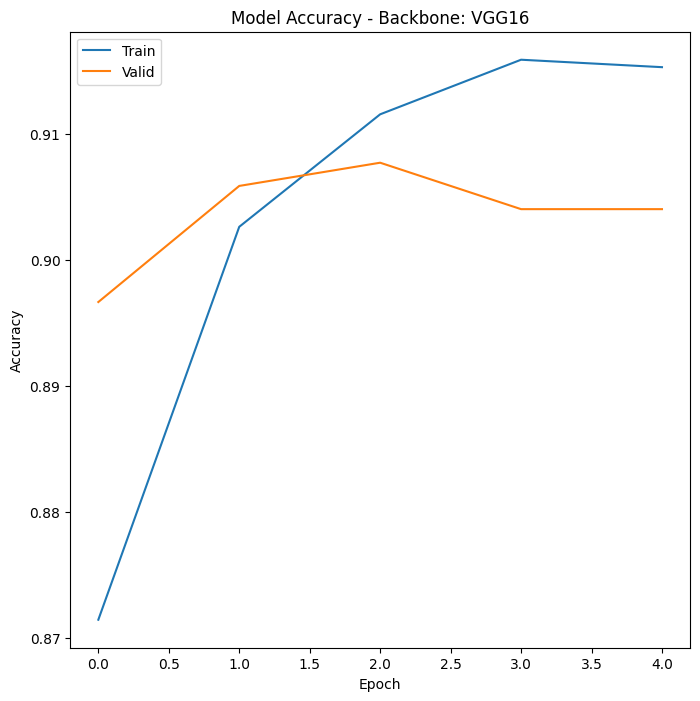

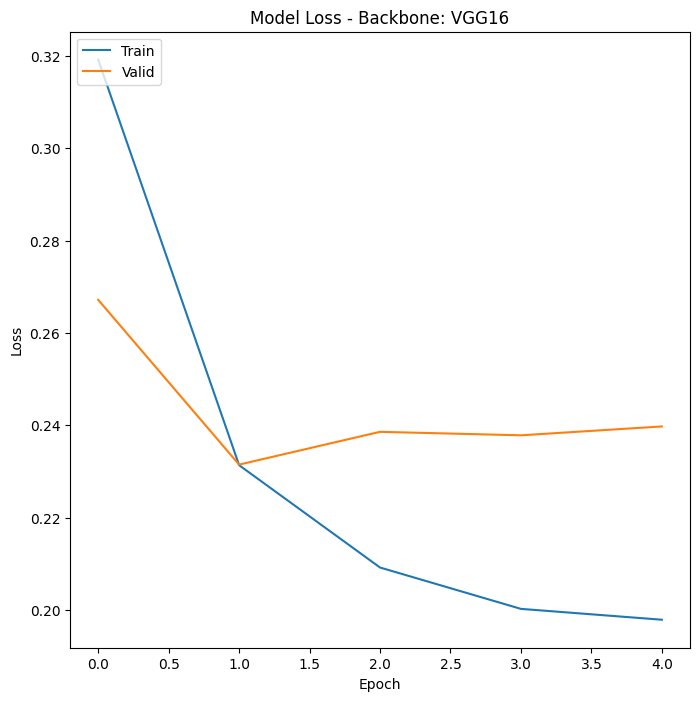

Training History - Backbone: ResNet50
dict_keys(['loss', 'accuracy', 'recall_m', 'precision_m', 'f1_m', 'val_loss', 'val_accuracy', 'val_recall_m', 'val_precision_m', 'val_f1_m'])


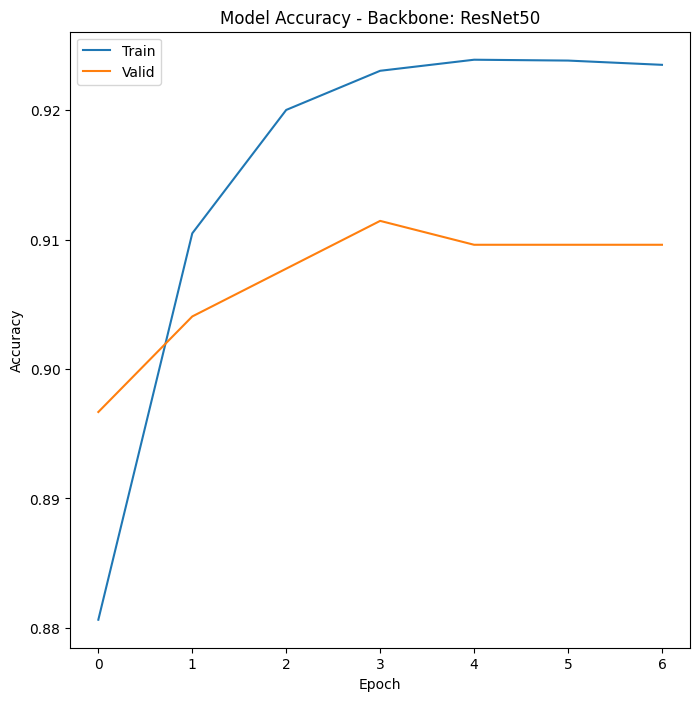

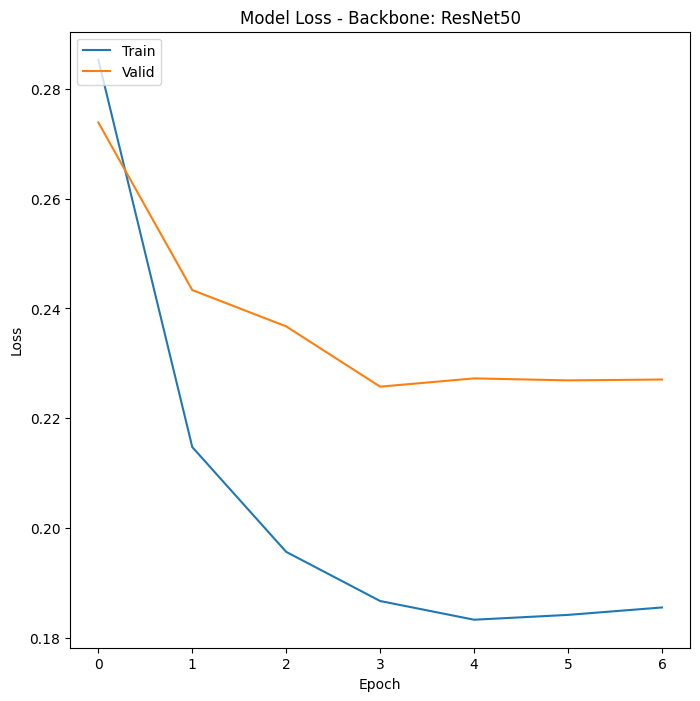

Training History - Backbone: MobileNet
dict_keys(['loss', 'accuracy', 'recall_m', 'precision_m', 'f1_m', 'val_loss', 'val_accuracy', 'val_recall_m', 'val_precision_m', 'val_f1_m'])


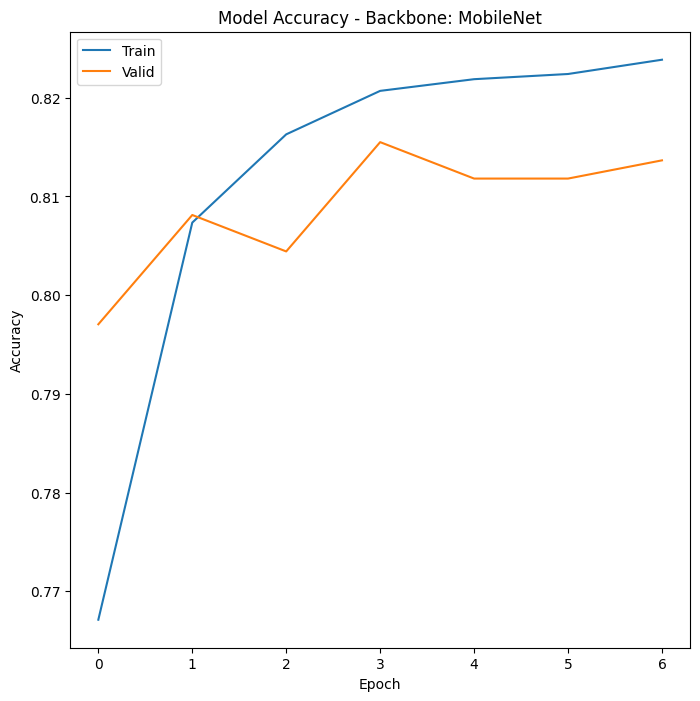

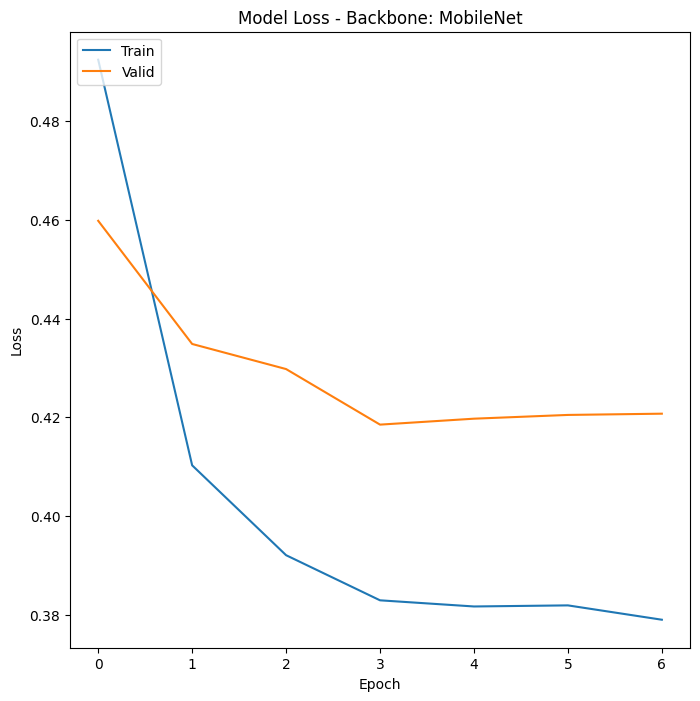

In [ ]:
# In kết quả lịch sử huấn luyện
for i, backbone in enumerate(backbones):
    history = history_list[i]

    print("Training History - Backbone:", backbone)
    print(history.history.keys())

    # Summarize history for accuracy
    plt.figure(figsize=(8, 8))
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model Accuracy - Backbone: ' + backbone)
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Valid'], loc='upper left')
    plt.show()

    # Summarize history for loss
    plt.figure(figsize=(8, 8))
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss - Backbone: ' + backbone)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Valid'], loc='upper left')
    plt.show()

Qua biểu đồ ta thấy được:
1. Với model accuray:
Mô hình train lúc đầu sẽ thấp tầm 74% và sau mỗi epoch sẽ tăng dần lên 86%
2. Với model loss:
Lúc đầu Loss sẽ cao và giảm dẫn sau mỗi epoch

##2.3 Load and evaluate the trained model

In [ ]:
%%shell
#pip -q install --upgrade --no-cache-dir gdown
#gdown -q 1bcVeSpXMqmFL4hireDKJXIf5aPTr6b3e
#gdown -q 1_k4P0BFxR6-1vipEnPBlUJFwlo_Ft3hY
#gdown -q 1XBCxHtkmfkj_6sGqx30oMhm_fOF9g1X

5/5 [==============================] - 2s 199ms/step - loss: 0.4185 - accuracy: 0.8155 - recall_m: 0.7978 - precision_m: 0.7978 - f1_m: 0.7978


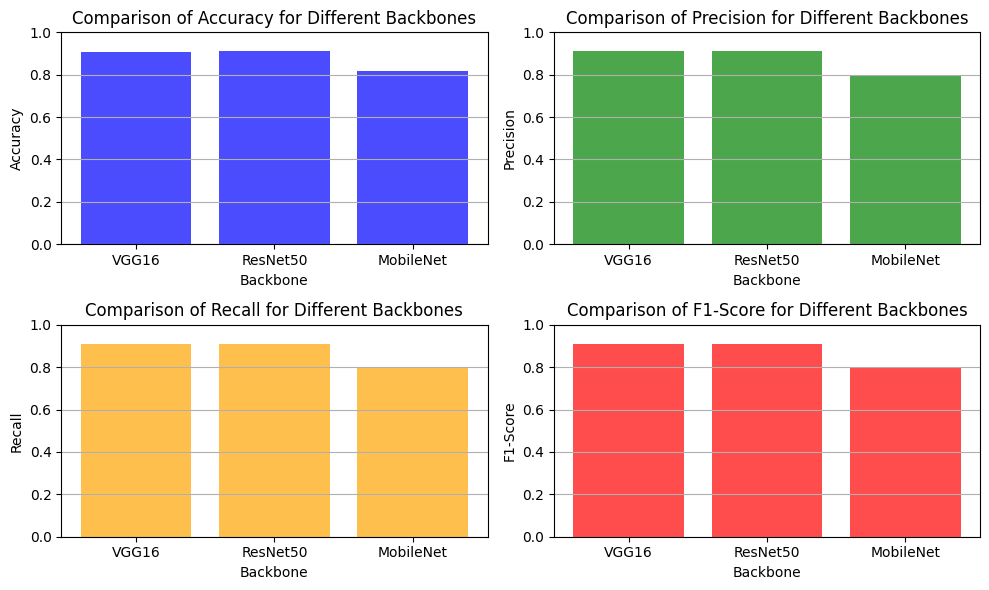

In [ ]:
from keras import backend as K
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# Đăng ký các hàm đo lường tùy chỉnh
custom_objects = {
    'recall_m': recall_m,
    'precision_m': precision_m,
    'f1_m': f1_m
}

# Kết quả evaluation của các backbone
evaluation_results = []

# Lặp qua từng backbone và lấy kết quả evaluation
losses = []
accuracies = []
precisions = []
recalls = []
f1_scores = []
for backbone in backbones:
    model_file = "./{:s}.h5".format(backbone)
    trained_model = load_model(model_file, custom_objects=custom_objects)
    evaluation = trained_model.evaluate(valid_set)
    evaluation_results.append((backbone, evaluation[0], evaluation[1], evaluation[2], evaluation[3], evaluation[4]))
    losses.append(evaluation[0])
    accuracies.append(evaluation[1])
    precisions.append(evaluation[2])
    recalls.append(evaluation[3])
    f1_scores.append(evaluation[4])

# Vẽ biểu đồ so sánh
plt.figure(figsize=(10, 6))

# Biểu đồ Accuracy
plt.subplot(221)
plt.bar(backbones, accuracies, color='blue', alpha=0.7)
plt.xlabel('Backbone')
plt.ylabel('Accuracy')
plt.title('Comparison of Accuracy for Different Backbones')
plt.ylim([0, 1])
plt.grid(axis='y')

# Biểu đồ Precision
plt.subplot(222)
plt.bar(backbones, precisions, color='green', alpha=0.7)
plt.xlabel('Backbone')
plt.ylabel('Precision')
plt.title('Comparison of Precision for Different Backbones')
plt.ylim([0, 1])
plt.grid(axis='y')

# Biểu đồ Recall
plt.subplot(223)
plt.bar(backbones, recalls, color='orange', alpha=0.7)
plt.xlabel('Backbone')
plt.ylabel('Recall')
plt.title('Comparison of Recall for Different Backbones')
plt.ylim([0, 1])
plt.grid(axis='y')

# Biểu đồ F1-score
plt.subplot(224)
plt.bar(backbones, f1_scores, color='red', alpha=0.7)
plt.xlabel('Backbone')
plt.ylabel('F1-Score')
plt.title('Comparison of F1-Score for Different Backbones')
plt.ylim([0, 1])
plt.grid(axis='y')

plt.tight_layout()
plt.show()


##2.4 Predicting and showing the result for some images

###2.4.1 Predict images in a batch and show the results

In [ ]:
# Import thêm thư viện keras.utils
from keras.utils import custom_object_scope

# Khởi tạo danh sách lưu trữ các mô hình
trained_models = []

# Lặp qua từng backbone và tải mô hình đã huấn luyện
for backbone in backbones:
    # Tải mô hình từ tệp tin
    model_file = "./{:s}.h5".format(backbone)
    with custom_object_scope({'recall_m': recall_m, 'precision_m': precision_m, 'f1_m': f1_m}):
        model = load_model(model_file)

    # Lưu trữ mô hình vào danh sách
    trained_models.append(model)


###2.4.2 show top ten correct classified imaged and incorrect classified imaged

Backbone: VGG16
43/43 [==============================] - 25s 592ms/step
Top 10 misclassified images:


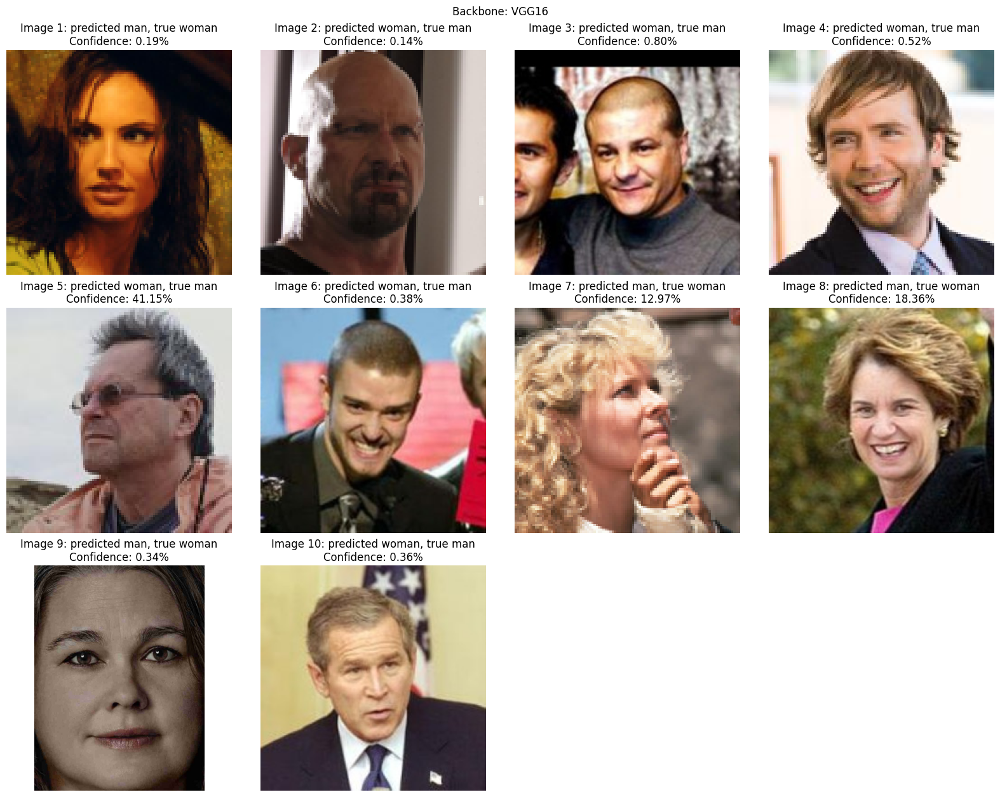

Top 10 misclassified images:


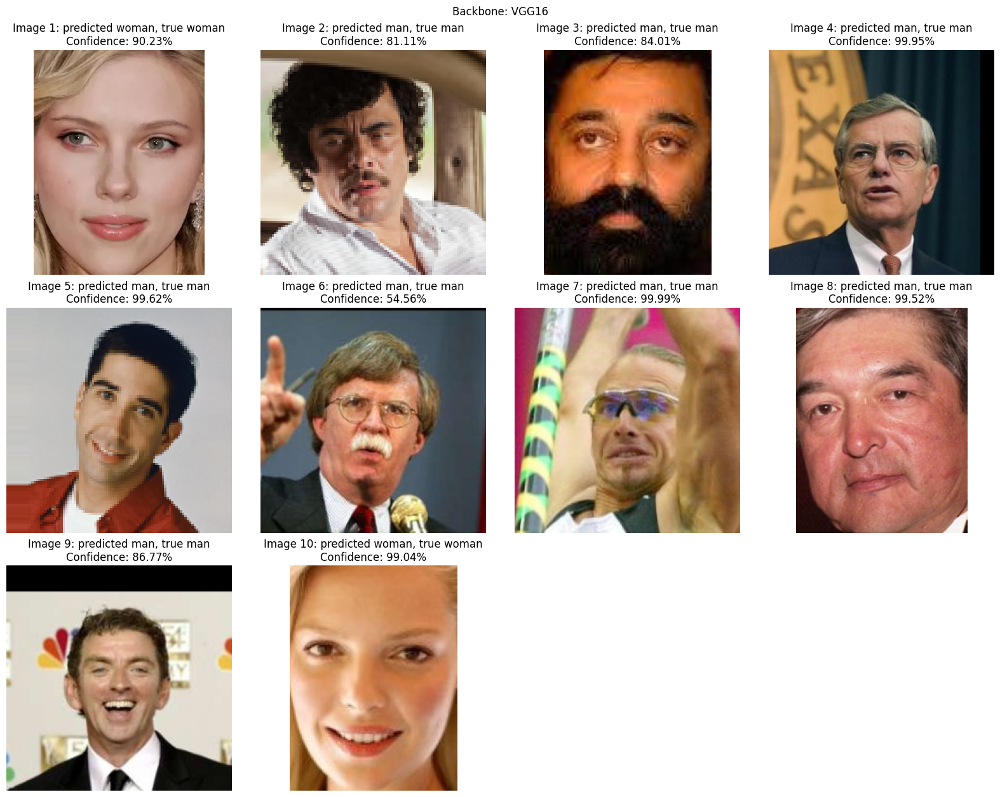

Backbone: ResNet50
43/43 [==============================] - 20s 463ms/step
Top 10 misclassified images:


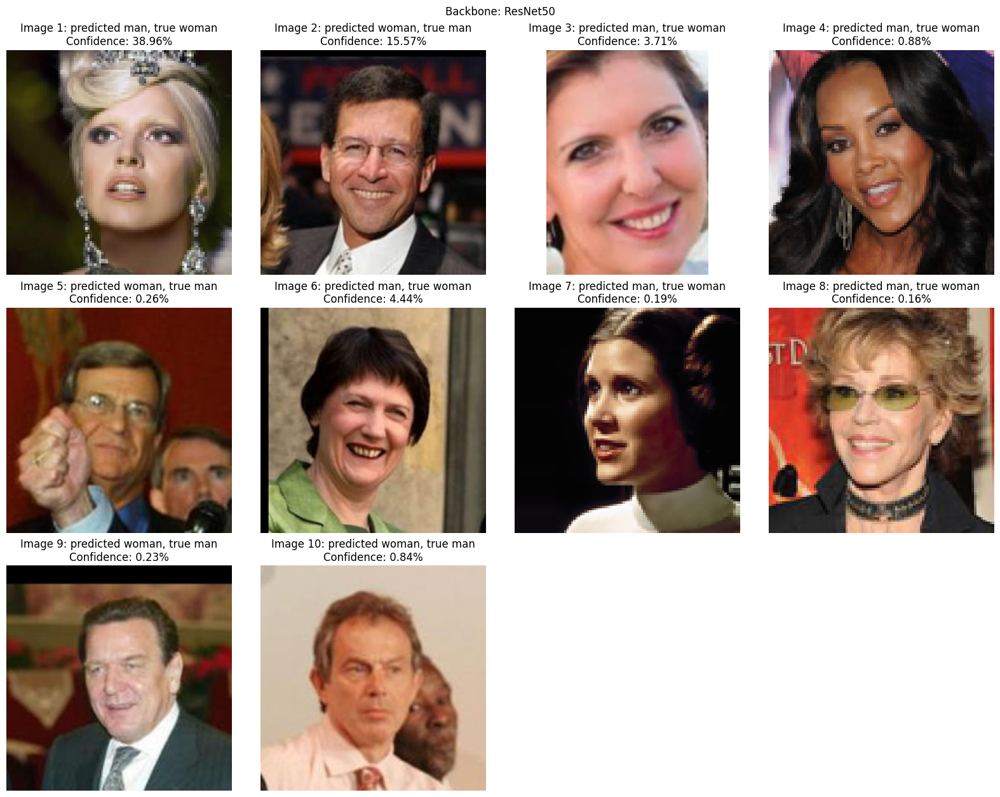

Top 10 misclassified images:


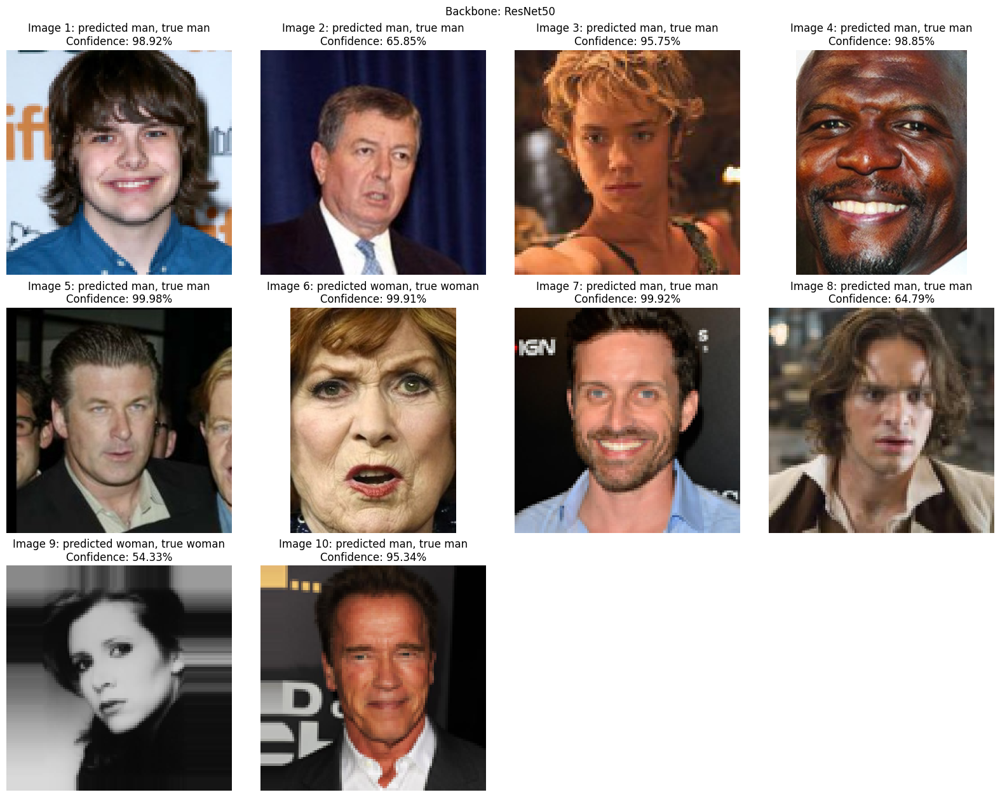

Backbone: MobileNet
43/43 [==============================] - 13s 295ms/step
Top 10 misclassified images:


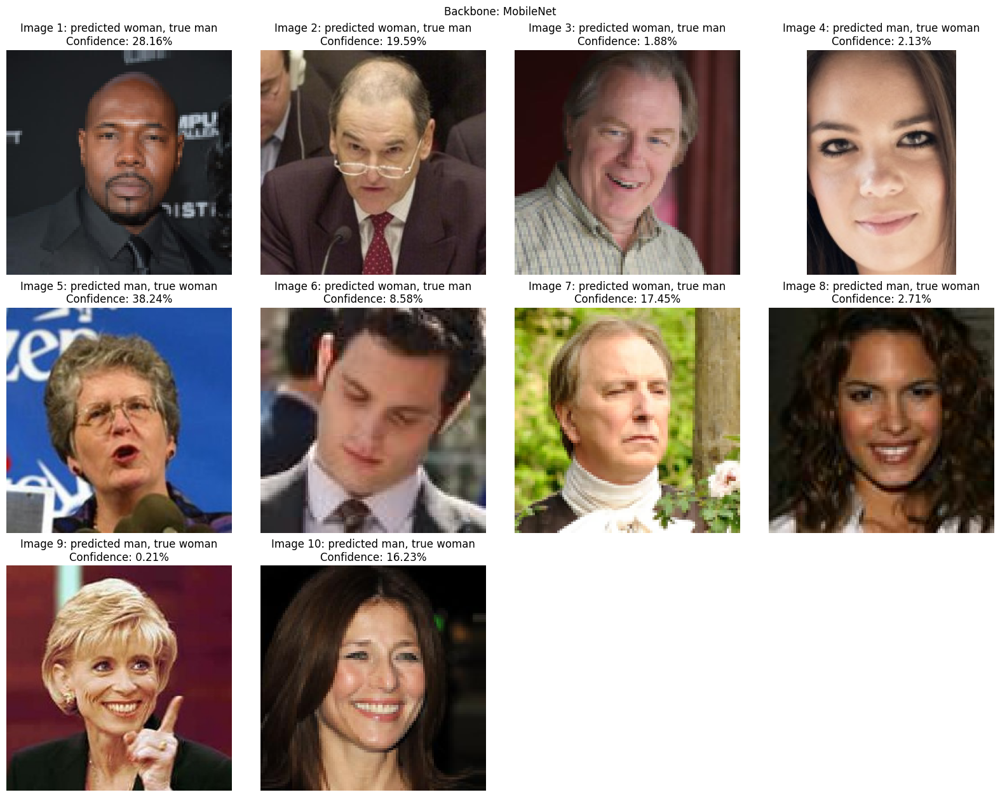

Top 10 misclassified images:


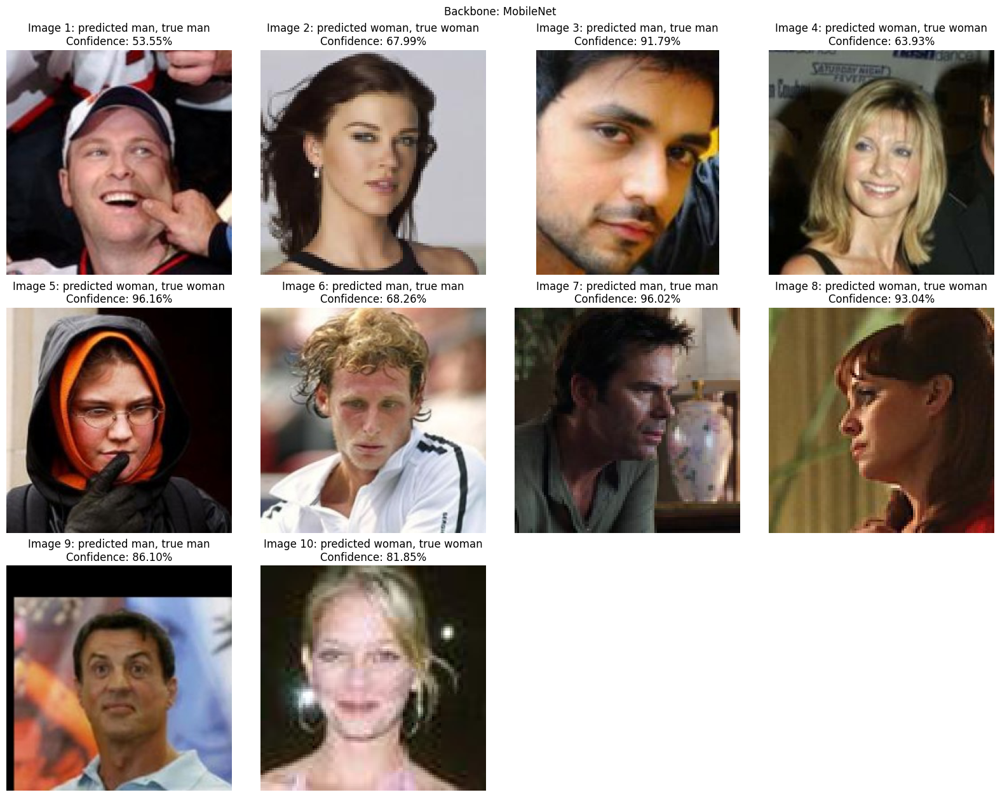

In [ ]:
from PIL import Image

# Số lượng hình ảnh muốn hiển thị
K = 10

# Lặp qua danh sách các mô hình đã huấn luyện
for model, backbone in zip(trained_models, backbones):
    print("Backbone:", backbone)

    # Dự đoán nhãn của hình ảnh từ tập dữ liệu test
    y_true = test_set.classes
    y_pred = model.predict(test_set)
    y_pred_classes = np.argmax(y_pred, axis=1)

    # Lấy chỉ số của những hình ảnh được phân loại sai và phân loại đúng
    misclassified_indices = np.where(y_pred_classes != y_true)[0]
    correctly_classified_indices = np.where(y_pred_classes == y_true)[0]

    # Lấy K hình ảnh được phân loại sai và đúng hàng đầu
    top_misclassified = np.random.choice(misclassified_indices, size=K, replace=False)
    top_correctly_classified = np.random.choice(correctly_classified_indices, size=K, replace=False)

    # Load tên các lớp
    class_names = sorted(test_set.class_indices, key=test_set.class_indices.get)

    # Hiển thị K hình ảnh được phân loại sai
    print("Top {:d} misclassified images:".format(K))
    fig = plt.figure(figsize=(16, 16), constrained_layout=True)
    for i in range(K):
        img_path = os.path.join(test_set.filepaths[top_misclassified[i]])
        img = Image.open(img_path)
        pred_label = class_names[y_pred_classes[top_misclassified[i]]]
        true_label = class_names[y_true[top_misclassified[i]]]
        confidence = y_pred[top_misclassified[i]][y_true[top_misclassified[i]]] * 100

        plt.subplot(4, 4, i + 1)
        plt.title("Image {:d}: predicted {:s}, true {:s}\nConfidence: {:.2f}%".format(i + 1, pred_label, true_label, confidence))
        plt.imshow(img)
        plt.axis('off')
    plt.suptitle("Backbone: {:s}".format(backbone))
    plt.show()

    # Hiển thị K hình ảnh được phân loại sai
    print("Top {:d} misclassified images:".format(K))
    fig = plt.figure(figsize=(16, 16), constrained_layout=True)
    for i in range(K):
        img_path = os.path.join(test_set.filepaths[top_correctly_classified[i]])
        img = Image.open(img_path)
        pred_label = class_names[y_pred_classes[top_correctly_classified[i]]]
        true_label = class_names[y_true[top_correctly_classified[i]]]
        confidence = y_pred[top_correctly_classified[i]][y_true[top_correctly_classified[i]]] * 100

        plt.subplot(4, 4, i + 1)
        plt.title("Image {:d}: predicted {:s}, true {:s}\nConfidence: {:.2f}%".format(i + 1, pred_label, true_label, confidence))
        plt.imshow(img)
        plt.axis('off')
    plt.suptitle("Backbone: {:s}".format(backbone))
    plt.show()


#Giải thích các chỉ số trên ảnh:
1. predict:kết quả mô dình dự đoán
2. true:nhãn kết quả của ảnh
3. confidence:độ tin cậy khi mô hình dự đoán ảnh so với nhãn